In this notebook we are going to extract the average sentiment scores based on LDA-extracted topic modelling of the review data

In [5]:
import numpy as np
import pandas as pd
# Set display options
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_colwidth', None)  # Show full width of column content
pd.set_option('display.max_rows', None)  # Show all rows
# Read reviews from csv files
reviews_amsterdam=pd.read_csv('reviews_amsterdam.csv.gz')
reviews_chicago=pd.read_csv('reviews_chicago.csv.gz')
reviews_london=pd.read_csv('reviews_london.csv.gz')
reviews_los_angeles=pd.read_csv('reviews_los_angeles.csv.gz')
reviews_new_york=pd.read_csv('reviews_new_york.csv.gz')
reviews_paris=pd.read_csv('reviews_paris.csv.gz')
reviews_melbourne=pd.read_csv('reviews_melbourne.csv.gz')
reviews_rome=pd.read_csv('reviews_rome.csv.gz')
reviews_sydney=pd.read_csv('reviews_sydney.csv.gz')
reviews_venice=pd.read_csv('reviews_venice.csv.gz')
reviews_amsterdam['city']='Amsterdam'
reviews_chicago['city']='Chicago'
reviews_london['city']='London'
reviews_los_angeles['city']='Los Angeles'
reviews_new_york['city']='New York'
reviews_paris['city']='Paris'
reviews_melbourne['city']='Melbourne'
reviews_rome['city']='Rome'
reviews_sydney['city']='Sydney'
reviews_venice['city']='Venice'

In [6]:
reviews_combined=pd.concat([reviews_amsterdam, reviews_chicago, reviews_london, reviews_los_angeles, reviews_new_york, reviews_paris, reviews_melbourne, reviews_rome, reviews_sydney, reviews_venice], ignore_index=True)

In [8]:
reviews_combined.shape

(11398600, 7)

In [9]:
#Import packages
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import re
from langdetect import detect, LangDetectException
import numpy as np
from joblib import dump, load  # For saving and loading models
import nltk
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import re
from langdetect import detect, LangDetectException


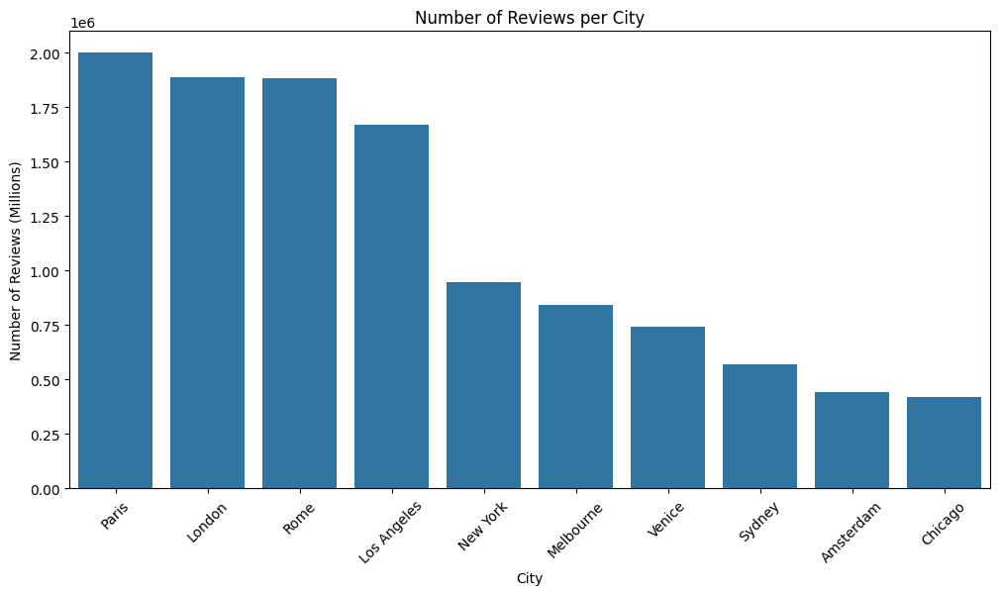

<Figure size 640x480 with 0 Axes>

In [11]:
#Show the distribution of number of reviews per city, make clear that it are millions of reviews
plt.figure(figsize=(12,6))
sns.countplot(data=reviews_combined, x='city', order=reviews_combined['city'].value_counts().index)
plt.xlabel('City')
plt.ylabel('Number of Reviews (Millions)')
plt.title('Number of Reviews per City')
plt.xticks(rotation=45)
plt.show()
plt.savefig('reviews_per_city_before_preprocessing.png')


Explanation of the Code

Language Filtering: We use TextBlob to detect the language of each review in the comments column, keeping only English reviews.

Text Preprocessing: We clean the comments by removing special characters and converting text to lowercase for consistency in the topic modeling step.

Topic Modeling: Using LDA with a CountVectorizer, we extract topics. You can adjust the number of topics (n_components) as needed.

Sentiment Analysis: For sentiment scoring, we calculate the polarity of each review using TextBlob, which provides a sentiment score between -1 (negative) and 1 (positive).

Aggregation: We group the reviews by listing_id and calculate the average sentiment score per listing.

This code will output a DataFrame, average_sentiment_per_listing, containing each listing's average sentiment score. This can be used for further analysis on how review sentiment correlates with listing performance.

In [6]:
reviews_combined.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,city
0,2818,1191,2009-03-30,10952,Lam,Daniel is really cool. The place was nice and clean. Very quiet neighborhood. He had maps and a lonely planet guide book in the room for you to use. I didnt have any trouble finding the place from Central Station. I would defintely come back! Thanks!,Amsterdam
1,2818,1771,2009-04-24,12798,Alice,"Daniel is the most amazing host! His place is extremely clean, and he provides everything you could possibly want (comfy bed, guidebooks & maps, mini-fridge, towels, even toiletries). He is extremely friendly and helpful, and will go out of his way to help you if needed, or just let you come and go as you please. Highly recommended!",Amsterdam
2,2818,1989,2009-05-03,11869,Natalja,"We had such a great time in Amsterdam. Daniel is an excellent host! Very friendly and everytime helpful. The room was cozy, comfortable, and VERY clean. Maps, towels, mini-fridge, coffee (very tasty) and tea supplies were provided. Bathroom with all the bathroom requires. Good location - next to the tram stop and it took just around 10-15 minutes to get to the city center.\r<br/>Totally recommendable!",Amsterdam
3,2818,2797,2009-05-18,14064,Enrique,Very professional operation. Room is very clean and comfortable. Location is close to tram or bus which take you to most of attractions. A great and helpful host who want to ensure you enjoy your stay.,Amsterdam
4,2818,3151,2009-05-25,17977,Sherwin,Daniel is highly recommended. He provided all necessities (and actually went way beyond what's expected of a great host). His place is very clean. It is also convenient to buses and trams which will take you around the city in minutes. You will truly feel like a local here.,Amsterdam


In [7]:
reviews_combined['listing_id'].nunique()

284376

In [8]:
reviews_combined['listing_id'].value_counts()

listing_id
50383849               4130
29819757               3689
17222007               3295
42409434               3024
32485135               2907
45045046               2775
26244787               2620
37706095               2479
41020735               2327
35636293               2317
40194697               2147
35145338               2050
53101911               2008
37122502               1941
858697692672545141     1912
32518543               1783
29093384               1777
35927687               1718
51619634               1696
30760930               1682
47408549               1650
43120947               1553
593322347340602809     1542
54401249               1537
54234294               1494
691676460109271194     1434
19670926               1382
50452179               1376
802052                 1324
37082515               1280
38090971               1250
30762441               1231
1990543                1227
846954                 1202
39436425               1190
37122162 

In [9]:
#add new word count column
reviews_combined['word_count'] = reviews_combined['comments'].apply(lambda x: len(str(x).split()))

In [8]:
# Step 1: Randomly sample 10,000 unique listing IDs
sampled_listing_ids = reviews_combined['listing_id'].drop_duplicates().sample(n=100, random_state=42)

# Step 2: Filter the DataFrame to include all reviews for the sampled listings
reviews_combined_sample = reviews_combined[reviews_combined['listing_id'].isin(sampled_listing_ids)]

# Step 3: Check the resulting shape
reviews_combined_sample.shape


(3154, 8)

In [6]:
reviews_combined.shape

(11398600, 8)

In [ ]:


# Download required NLTK data
nltk.download('punkt')

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Step 1: Sample data and handle missing values
df = reviews_combined
df = reviews_combined.dropna(subset=['comments'])

# Step 2: Filter for English reviews
def is_english(text):
    try:
        return detect(text) == 'en'
    except LangDetectException:
        return False

df['is_english'] = df['comments'].apply(is_english)
df = df[df['is_english']]
if len(df) == 0:
    raise ValueError("No English reviews found after filtering.")

# Step 3: Preprocess text (remove stopwords)
stopwords = set(ENGLISH_STOP_WORDS)

def preprocess_text(text):
    text = re.sub(r'\W+', ' ', text.lower())  # Remove non-alphanumeric characters
    words = text.split()
    return ' '.join([word for word in words if word not in stopwords])

df['cleaned_comments'] = df['comments'].apply(preprocess_text)
df = df[df['cleaned_comments'].str.len() > 2]
if len(df) == 0:
    raise ValueError("No comments left after preprocessing.")



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
C:\Users\PC\AppData\Local\Temp\ipykernel_4240\1639826741.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['is_english'] = df['comments'].apply(is_english)


In [8]:
df.shape

(8754635, 10)

In [2]:
#save as csv
df.to_csv('reviews_combined_cleaned.csv', index=False)

NameError: name 'df' is not defined

In [ ]:

#load from csv
df = pd.read_csv('reviews_combined_cleaned.csv')

In [7]:
df.shape

(8754635, 10)

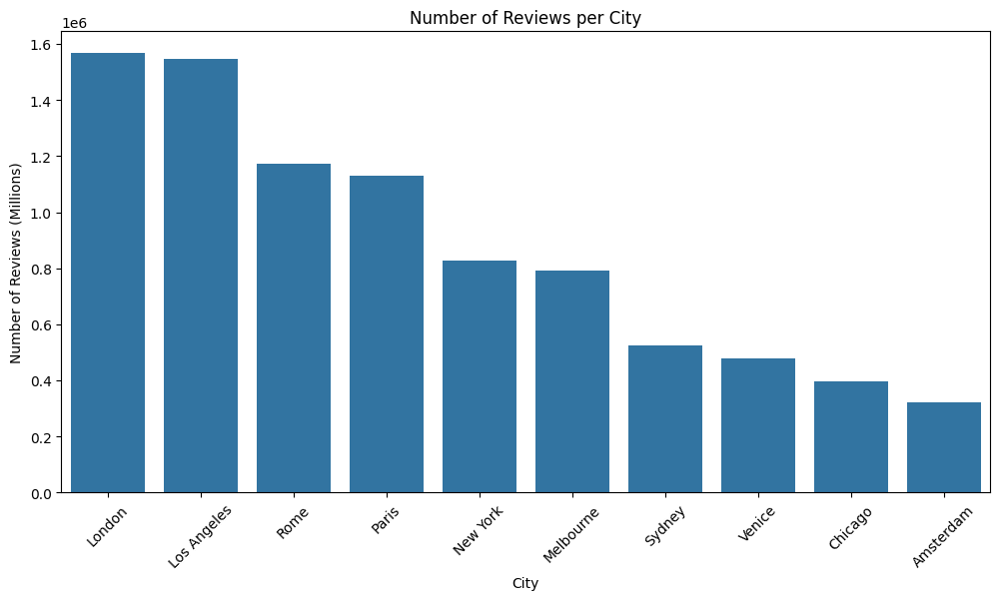

<Figure size 640x480 with 0 Axes>

In [4]:
#Show the distribution of number of reviews per city, make clear that it are millions of reviews
plt.figure(figsize=(12,6))
sns.countplot(data=df, x='city', order=df['city'].value_counts().index)
plt.xlabel('City')
plt.ylabel('Number of Reviews (Millions)')
plt.title('Number of Reviews per City')
plt.xticks(rotation=45)
plt.show()
plt.savefig('reviews_per_city_after_preprocessing.png')


C:\Users\PC\AppData\Local\Temp\ipykernel_12968\4037026675.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=reviews_combined, x='city', order=reviews_combined['city'].value_counts().index, palette=city_palette)
C:\Users\PC\AppData\Local\Temp\ipykernel_12968\4037026675.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='city', order=df['city'].value_counts().index, palette=city_palette)


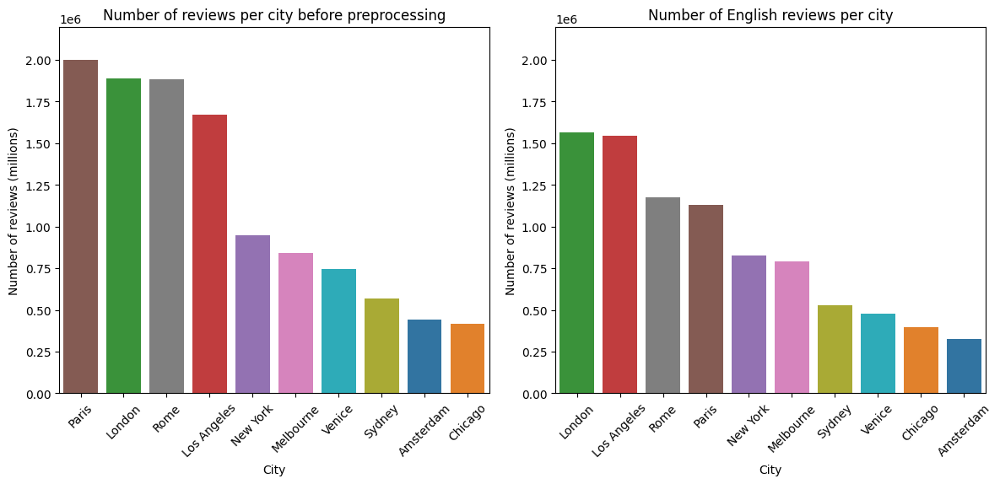

In [18]:
unique_cities = reviews_combined['city'].unique()
city_palette = dict(zip(unique_cities, sns.color_palette('tab10', len(unique_cities))))

# Set figure size and layout
plt.figure(figsize=(12, 6))

# Plot the "Before Preprocessing" subplot
plt.subplot(1, 2, 1)
sns.countplot(data=reviews_combined, x='city', order=reviews_combined['city'].value_counts().index, palette=city_palette)
plt.xlabel('City')
plt.ylabel('Number of reviews (millions)')
plt.title('Number of reviews per city before preprocessing')
plt.xticks(rotation=45)

# Set y-axis limits to ensure both subplots have the same scale
y_max = reviews_combined['city'].value_counts().max()
plt.ylim(0, y_max * 1.1)

# Plot the "After Preprocessing" subplot
plt.subplot(1, 2, 2)
sns.countplot(data=df, x='city', order=df['city'].value_counts().index, palette=city_palette)
plt.xlabel('City')
plt.ylabel('Number of reviews (millions)')
plt.title('Number of English reviews per city')
plt.xticks(rotation=45)
plt.ylim(0, y_max * 1.1)  # Use the same y-axis limit as the "Before" subplot

# Final layout adjustments and save
plt.tight_layout()
plt.savefig('reviews_per_city_before_and_after_preprocessing.png')
plt.show()


In [ ]:
import dump # For saving and loading models

ModuleNotFoundError: No module named 'load'

In [4]:
from collections import Counter

# Step 4: Identify and remove words in more than 10% of the reviews
print(f"Original dataframe shape: {df.shape}")

df2 = df.sample(frac=0.1, random_state=42)
print(f"Sampled dataframe shape (10% of data): {df2.shape}")

# Create a Counter to count word occurrences across reviews
word_in_reviews_count = Counter()

# Iterate through each comment and add unique words to the counter
for idx, comment in enumerate(df2['cleaned_comments']):
    unique_words = set(comment.split())  # Use set to count each word only once per review
    word_in_reviews_count.update(unique_words)

    # Print every 100,000th review to understand progress
    if (idx + 1) % 100000 == 0:
        print(f"Processed {idx + 1} reviews.")

# Calculate words that occur in more than 10% of the reviews without storing all frequencies
total_reviews = len(df2)
frequent_words = []

# Iterate through the counter to find words that are in more than 10% of the reviews
for word, count in word_in_reviews_count.items():
    if count / total_reviews > 0.1:
        frequent_words.append(word)

print(f"\nTotal unique words considered: {len(word_in_reviews_count)}")
print(f"Words removed for being in more than 10% of the reviews: {len(frequent_words)}")






Original dataframe shape: (8754635, 10)
Sampled dataframe shape (10% of data): (875464, 10)
Processed 100000 reviews.
Processed 200000 reviews.
Processed 300000 reviews.
Processed 400000 reviews.
Processed 500000 reviews.
Processed 600000 reviews.
Processed 700000 reviews.
Processed 800000 reviews.

Total unique words considered: 116869
Words removed for being in more than 10% of the reviews: 24


In [5]:
print(f"List of frequent words : {frequent_words}")

List of frequent words : ['helpful', 'nice', 'host', 'location', 'apartment', 'place', 'great', 'stay', 'really', 't', 's', 'time', 'br', 'good', 'lovely', 'recommend', 'definitely', 'easy', 'clean', 'comfortable', 'perfect', 'close', 'room', 'restaurants']


In [6]:
#Save frequent words as csv
frequent_words_df = pd.DataFrame(frequent_words)
frequent_words_df.to_csv('frequent_words.csv', index=False)

In [7]:
import pandas as pd

# Step 4b: Define function to remove frequent words
def remove_frequent_words(text, frequent_words_set):
    words = text.split()
    return ' '.join(word for word in words if word not in frequent_words_set)

# Convert frequent words list to a set for faster lookup
frequent_words_set = set(frequent_words)
print(f"Number of frequent words to remove: {len(frequent_words_set)}")

# Apply filtering in batches to avoid memory issues
batch_size = 100000
filtered_comments = []

print("Starting to filter comments in batches...")
for start in range(0, len(df), batch_size):
    end = min(start + batch_size, len(df))
    df_batch = df.iloc[start:end]
    df_batch['filtered_comments'] = df_batch['cleaned_comments'].apply(lambda text: remove_frequent_words(text, frequent_words_set))
    filtered_comments.append(df_batch)

# Concatenate all filtered batches to create the final DataFrame
df = pd.concat(filtered_comments, ignore_index=True)

# Remove comments that are empty or too short after filtering
df = df[df['filtered_comments'].str.len() > 2]
print(f"Dataframe shape after removing empty or very short comments: {df.shape}")

if len(df) == 0:
    raise ValueError("No comments left after filtering frequent words.")

# Step 5: Pre-sort the data for consistency
df = df.sort_values(by='listing_id').reset_index(drop=True)
print(f"Dataframe shape after sorting by listing_id: {df.shape}")

# Step 6: Vectorize text using TF-IDF
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=5000)

# Adding debug statements before and after transformation
print("Starting TF-IDF vectorization...")
X = vectorizer.fit_transform(df['filtered_comments'])
print("TF-IDF vectorization completed.")
print(f"TF-IDF matrix shape: {X.shape}")
print(f"Number of non-zero elements in the TF-IDF matrix: {X.nnz}")
print(f"Memory required for the TF-IDF matrix (approximate): {X.nnz * 8 / (1024**3):.2f} GB")



Number of frequent words to remove: 24
Starting to filter comments in batches...


C:\Users\PC\AppData\Local\Temp\ipykernel_5404\4010352450.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_batch['filtered_comments'] = df_batch['cleaned_comments'].apply(lambda text: remove_frequent_words(text, frequent_words_set))
C:\Users\PC\AppData\Local\Temp\ipykernel_5404\4010352450.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_batch['filtered_comments'] = df_batch['cleaned_comments'].apply(lambda text: remove_frequent_words(text, frequent_words_set))
C:\Users\PC\AppData\Local\Temp\ipy

Dataframe shape after removing empty or very short comments: (8510835, 11)
Dataframe shape after sorting by listing_id: (8510835, 11)
Starting TF-IDF vectorization...
TF-IDF vectorization completed.
TF-IDF matrix shape: (8510835, 5000)
Number of non-zero elements in the TF-IDF matrix: 148681328
Memory required for the TF-IDF matrix (approximate): 1.11 GB


In [8]:
#Save the TF-IDF matrix
import scipy.sparse
scipy.sparse.save_npz('tfidf_matrix.npz', X)


In [9]:
# Step 7: Define the number of topics for LDA and train with fixed random state
num_topics = 4
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(X)

# Step 8: Extract topic words
feature_names = vectorizer.get_feature_names_out()
topic_words = {
    topic_idx: [feature_names[i] for i in topic.argsort()[-15:][::-1]]
    for topic_idx, topic in enumerate(lda.components_)
}

print("\nTop Words per Topic:")
for topic_idx, words in topic_words.items():
    print(f"Topic #{topic_idx + 1}: {words}")

# Step 9: Assign topics to reviews
topic_assignments = lda.transform(X)
df['assigned_topic'] = topic_assignments.argmax(axis=1)




Top Words per Topic:
Topic #1: ['home', 'amazing', 'highly', 'thank', 'beautiful', 'felt', 'feel', 'like', 'best', 'experience', 'airbnb', 'house', 'wonderful', 'stayed', 'loved']
Topic #2: ['walk', 'station', 'walking', 'distance', 'metro', 'walking distance', 'city', 'near', 'quiet', 'train', 'shops', 'just', 'minutes', 'bus', 'away']
Topic #3: ['super', 'friendly', 'beautiful', 'wonderful', 'responsive', 'hosts', 'house', 'thanks', 'amazing', 'enjoyed', 'excellent', 'loved', 'highly', 'cozy', 'quiet']
Topic #4: ['check', 'bed', 'communication', 'night', 'overall', 'bathroom', 'small', 'bit', 'kitchen', 'quick', 'just', 'like', 'didn', 'instructions', 'shower']


In [10]:
df.shape

(8510835, 12)

In [11]:
df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,city,word_count,is_english,cleaned_comments,filtered_comments,assigned_topic
0,109,74506539,2016-05-15,22509885,Jenn,Me and two friends stayed for four and a half ...,Los Angeles,61,True,friends stayed half months great place stay ap...,friends stayed half months enjoyed having park...,1
1,109,449036,2011-08-15,927861,Edwin,The host canceled my reservation the day befor...,Los Angeles,9,True,host canceled reservation day arrival,canceled reservation day arrival,3
2,2384,873232542403490035,2023-04-19,26860063,Agathe,"Rebecca was the most wonderful host, she defin...",Chicago,37,True,rebecca wonderful host definitely trip chicago...,rebecca wonderful trip chicago better wonderfu...,0
3,2384,78135484,2016-06-05,46881774,Li,I was on a 10 week visit to University of Chic...,Chicago,93,True,10 week visit university chicago fortune stay ...,10 week visit university chicago fortune rebec...,1
4,2384,33787848,2015-06-01,29995084,Tanguy,"Rebecca is a very charming and nice personn, ...",Chicago,50,True,rebecca charming nice personn super welcome he...,rebecca charming personn super welcome accomod...,2


In [13]:
#Save df as csv
df.to_csv('reviews_combined_lda.csv', index=False)

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [14]:
import numpy as np
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk

nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()

# Step 10: Sentiment Analysis using VADER
def vader_sentiment(text):
    return sia.polarity_scores(str(text))['compound']  # Convert text to string to avoid issues

df['sentiment_score'] = df['comments'].apply(vader_sentiment)

# Step 11: Assign sentiment scores to each topic column for each review
for topic_num in range(num_topics):
    df[f'sentiment_topic_{topic_num}'] = np.where(df['assigned_topic'] == topic_num, df['sentiment_score'], 0)

# Step 12: Calculate average sentiment score per topic per listing_id
average_sentiment_per_topic_listing = df.groupby('listing_id').agg({
    'sentiment_topic_0': 'mean',
    'sentiment_topic_1': 'mean',
    'sentiment_topic_2': 'mean',
    'sentiment_topic_3': 'mean'
}).reset_index()




[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [15]:
#Step 13: Add the average word count per listing of original reviews_combined to the dataframe
average_word_count_per_listing = df.groupby('listing_id').agg({
    'word_count': 'mean'
}).reset_index()
average_sentiment_per_topic_listing= average_sentiment_per_topic_listing.merge(average_word_count_per_listing, on='listing_id')
average_sentiment_per_topic_listing.rename(columns={'word_count':'average_word_count'}, inplace=True)

# Display the result
print("\nAverage Sentiment Score per Topic for Each Listing:")
print(average_sentiment_per_topic_listing.head())


Average Sentiment Score per Topic for Each Listing:
   listing_id  sentiment_topic_0  sentiment_topic_1  sentiment_topic_2  \
0         109           0.000000           0.465800           0.000000   
1        2384           0.612774           0.180052           0.058270   
2        2595           0.154763           0.155574           0.170772   
3        2708           0.438960           0.078677           0.261722   
4        2732           0.497774           0.167865           0.085757   

   sentiment_topic_3  average_word_count  
0           0.000000           35.000000  
1           0.071776           70.431624  
2           0.307414           68.139535  
3           0.115680           63.800000  
4           0.196074          122.086957  


In [21]:
average_sentiment_per_topic_listing.shape


(269520, 6)

In [17]:
#count duplicates
average_sentiment_per_topic_listing.duplicated().sum()

np.int64(0)

In [18]:
#save the result as csv
average_sentiment_per_topic_listing.to_csv('average_sentiment_per_topic_listing.csv', index=False)

In [20]:
#load the result from csv
average_sentiment_per_topic_listing = pd.read_csv('average_sentiment_per_topic_listing.csv')

In [22]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Define a function to create descriptive word clouds with no word overlap
def create_descriptive_wordclouds_no_overlap(topic_words, topic_descriptions, colors="coolwarm"):
    """
    Generates a single figure with descriptive word clouds for given topics, avoiding word overlap.

    :param topic_words: Dictionary where keys are topic indices and values are lists of words for each topic.
    :param topic_descriptions: List of descriptive titles corresponding to each topic.
    :param colors: Color scheme for the word clouds.
    """
    num_topics = len(topic_words)
    cols = 2  # Number of columns
    rows = (num_topics + 1) // cols  # Number of rows

    # Create a subplot grid
    fig, axs = plt.subplots(rows, cols, figsize=(20, 20))
    axs = axs.flatten()  # Flatten for easy iteration

    for i, ax in enumerate(axs):
        if i < num_topics:
            # Generate word cloud for each topic
            word_frequencies = {word: 1 for word in topic_words[i]}  # Equal weight to avoid overlap
            wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=colors, prefer_horizontal=1).generate_from_frequencies(word_frequencies)
            ax.imshow(wordcloud, interpolation='bilinear')
            ax.set_title(topic_descriptions[i], fontsize=18, fontweight='bold')  # Descriptive title
            ax.axis('off')
        else:
            # Hide extra subplots if topics < rows * cols
            ax.axis('off')

    plt.tight_layout()
    plt.show()


# Example descriptive titles for the topics
topic_descriptions_example = [
    "Topic #1: Accommodation Features and Practicality",
    "Topic #2: Accessibility and Location",
    "Topic #3: Aesthetic Appeal and Guest Enjoyment",
    "Topic #4: Host Interaction and Ease of Stay"
]

# Create descriptive word clouds
create_descriptive_wordclouds_no_overlap(topic_words, topic_descriptions_example, colors="viridis")  # Avoiding yellow colors and ensuring no overlap


NameError: name 'topic_words' is not defined